# Resonances 1 - Introduction & Single Channel Resonances
---
This notebook should visualize the different steps to build, apply and evaluate amplitudes build with the K-matrix formalism. We will focus on amplitudes for **formation and production processes** that only contain 2 body interactions.

A **formation process** can be defined as
$$A+B\to R \to C + D.$$
With two particles $A$ and $B$ interacting to form a resonance $R$, that then decays into two particles $C$ and $D$.

A **production process** can be defined as
$$ A+B\to R + S \to C + D + S,$$
or
$$ Z\to R + S \to C + D + S.$$
In this case a resonance $R$ and a spectator particle $S$ is either produced via the interaction of the particles $A$ and $B$, or through the decay of particle $Z$. $R$ then again decays into $C$ and $D$, without interacting with $S$. In general $A,B,C$ and $D$ can be the same particles.

## Preparation

In [224]:
# Import libraries
import sys

import numpy as np

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
from matplotlib import color_sequences

from scipy.ndimage import maximum_filter

from IPython.display import display, Math

import seaborn as sns

sys.path.append("utils")

In [225]:
fig_dir = "/home/n_inde01/sciebo/Doktor/phinx/Images/tutorial_notebooks/resonances_1_single_channel/"
save_fig = True

sns.set_theme(context="notebook", style="whitegrid", palette="deep")

In [226]:
try:
  import google.colab
  using_colab = True
except ImportError:
  using_colab = False

if using_colab:
  !rm -r utils
  !mkdir utils
  !wget https://raw.githubusercontent.com/n-idw/tutorials/refs/heads/main/utils/dynamics.py -O utils/dynamics.py

## 1. The Complex Valued Momentum and Phase Space Factor

Formation and production amplitudes are in general complex valued quantities which can take complex numbers as an input. Therefore one has to be careful when using functions like the square root or logarithm as they are multi-valued functions. To solve this ambiguity so called Riemann surfaces are introduced, which connects the solutions of the different solutions of the multi-valued functions (also called Riemann sheets), at points where their values are equal. These connection points form a so called **branch cut**, along which a single Riemann sheet becomes non-analytical, meaning there is a sudden jump of the function at a threshold. However connecting different sheets at the branch cut restores the analyticity of whole function. This brach cut can be chosen arbitrarily either between two points where the function becomes single-valued, also called **branch point**, or between one branch point and infinity.

### 1.1 The Complex Square Root

We know that there are 2 solutions for $y$ given the equation
$$ x = y^2,$$
$+\sqrt{y}$ and $-\sqrt{y}$. Analogously, if one takes the square root of a complex number $z=r\cdot e^{i\varphi}$, there are two solutions:
$$ \sqrt{z} = \pm \sqrt{r} \cdot e^{i \varphi / 2}$$
The multi-valued nature of this function can be seen if one images making a full circle around the origin with a constant radius $r$ on the complex plain. One would expect that after making the full rotation, one would get the same value again, meaning the values for $\varphi=0$ and $\varphi=2\pi$ are the same. However because we divide by 2 in the exponential function, we efficiently only applied a rotation of $\pi$, resulting in a opposite sign for $\varphi=0$ in contrast to $\varphi=2\pi$. In this case, if we choose $\varphi$ to be the angle with respect to the positive $x$-axis, we get a branch cut from $0$ to plus infinity, as the square root is unambiguous at $z=0$, making it the branch point.

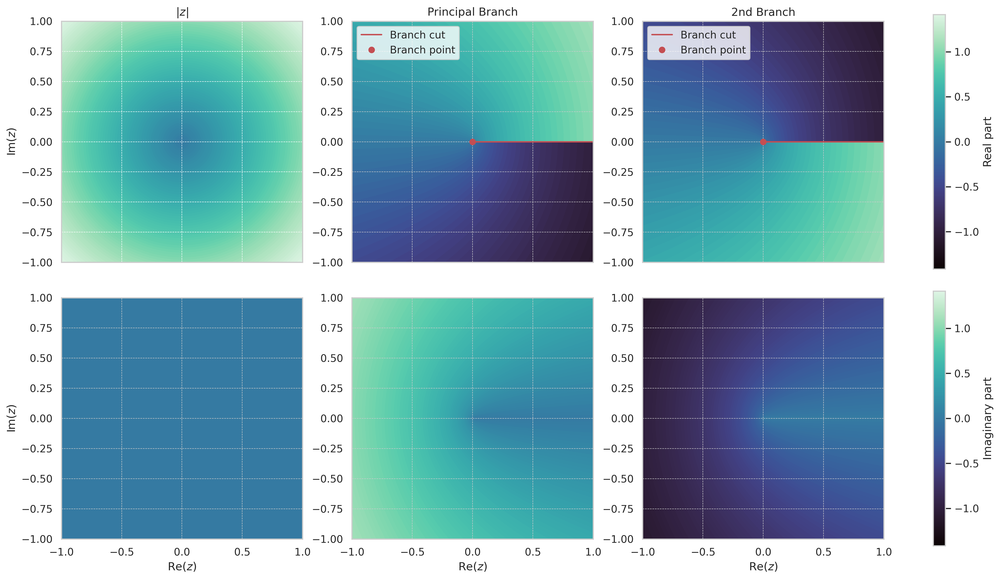

In [227]:
plt.close("all")
r = np.linspace(0, 2, 100)
phi = np.linspace(0, 2 * np.pi, 100)

R, PHI = np.meshgrid(r, phi)
absZ = R
sqrtZ = np.sqrt(R) * np.exp(1j * PHI / 2)
sqrtZ_2nd_branch = -np.sqrt(R) * np.exp(1j * PHI / 2)

X = R * np.cos(PHI)
Y = R * np.sin(PHI)

color_norm = Normalize(vmin=np.min(np.real(sqrtZ)), vmax=np.max(np.real(sqrtZ)))
color_norm2 = Normalize(vmin=-np.max(np.imag(sqrtZ)), vmax=np.max(np.imag(sqrtZ)))

fig, ax = plt.subplots(
    2, 4, sharex="col", figsize=(15, 9), width_ratios=[1, 1, 1, 0.05], dpi=300
)

ax[0, 0].contourf(X, Y, absZ, 100, norm=color_norm, cmap="mako", zorder=0)
ax[0, 0].grid(ls="--", lw=0.5)
ax[0, 0].set_xlim(-1, 1)
ax[0, 0].set_ylim(-1, 1)
ax[0, 0].set_box_aspect(1)
ax[0, 0].grid(True, "major", "both", c="white")
ax[0, 0].set_title("$|z|$")
ax[0, 0].set_ylabel("Im($z$)")

ax[0, 1].contourf(X, Y, np.real(sqrtZ), 100, norm=color_norm, cmap="mako", zorder=0)
ax[0, 1].grid(ls="--", lw=0.5)
ax[0, 1].plot([0, 2], [0, 0], "r", label="Branch cut")
ax[0, 1].plot(0, 0, "ro", label="Branch point")
ax[0, 1].set_xlim(-1, 1)
ax[0, 1].set_ylim(-1, 1)
ax[0, 1].set_box_aspect(1)
ax[0, 1].legend(loc="upper left")
ax[0, 1].set_title("Principal Branch")

ax[0, 2].contourf(
    X, Y, np.real(sqrtZ_2nd_branch), 100, norm=color_norm, cmap="mako", zorder=0
)
ax[0, 2].grid(ls="--", lw=0.5)
ax[0, 2].plot([0, 2], [0, 0], "r", label="Branch cut")
ax[0, 2].plot(0, 0, "ro", label="Branch point")
ax[0, 2].set_xlim(-1, 1)
ax[0, 2].set_ylim(-1, 1)
ax[0, 2].set_box_aspect(1)
ax[0, 2].legend(loc="upper left")
ax[0, 2].set_title("2nd Branch")

fig.colorbar(
    ScalarMappable(norm=color_norm, cmap="mako"), cax=ax[0, 3], label="Real part"
)

ax[1, 0].contourf(X, Y, np.imag(absZ), 100, norm=color_norm2, cmap="mako", zorder=0)
ax[1, 0].grid(ls="--", lw=0.5)
ax[1, 0].set_xlim(-1, 1)
ax[1, 0].set_ylim(-1, 1)
ax[1, 0].set_box_aspect(1)
ax[1, 0].set_xlabel("Re($z$)")
ax[1, 0].set_ylabel("Im($z$)")

ax[1, 1].contourf(X, Y, np.imag(sqrtZ), 100, norm=color_norm2, cmap="mako", zorder=0)
ax[1, 1].grid(ls="--", lw=0.5)
ax[1, 1].set_xlim(-1, 1)
ax[1, 1].set_ylim(-1, 1)
ax[1, 1].set_box_aspect(1)
ax[1, 1].set_xlabel("Re($z$)")

ax[1, 2].contourf(
    X, Y, np.imag(sqrtZ_2nd_branch), 100, norm=color_norm2, cmap="mako", zorder=0
)
ax[1, 2].grid(ls="--", lw=0.5)
ax[1, 2].set_xlim(-1, 1)
ax[1, 2].set_ylim(-1, 1)
ax[1, 2].set_box_aspect(1)
ax[1, 2].set_xlabel("Re($z$)")

fig.colorbar(
    ScalarMappable(norm=color_norm2, cmap="mako"), cax=ax[1, 3], label="Imaginary part"
)

fig.tight_layout()

if save_fig:
    fig.savefig(
        f"{fig_dir}/sqrt_z.png",
        dpi=300,
    )
    fig.savefig(
        f"{fig_dir}/sqrt_z.pdf",
        dpi=300,
    )
plt.show()

On the left one can see the real part of the fully single-valued function $f(z)= |z|$, while on the middle and right there is the real part of the complex square root, with a branch cut from $z=0$ to $z=+\infty$. Plotted in the middle is the branch with the positive square root $\sqrt{r}$, also often called the principal branch while on the right there is the 2nd branch with $-\sqrt{r}$.

The full Riemann surface can now be plotted by attaching the principal branch to the 2nd branch.

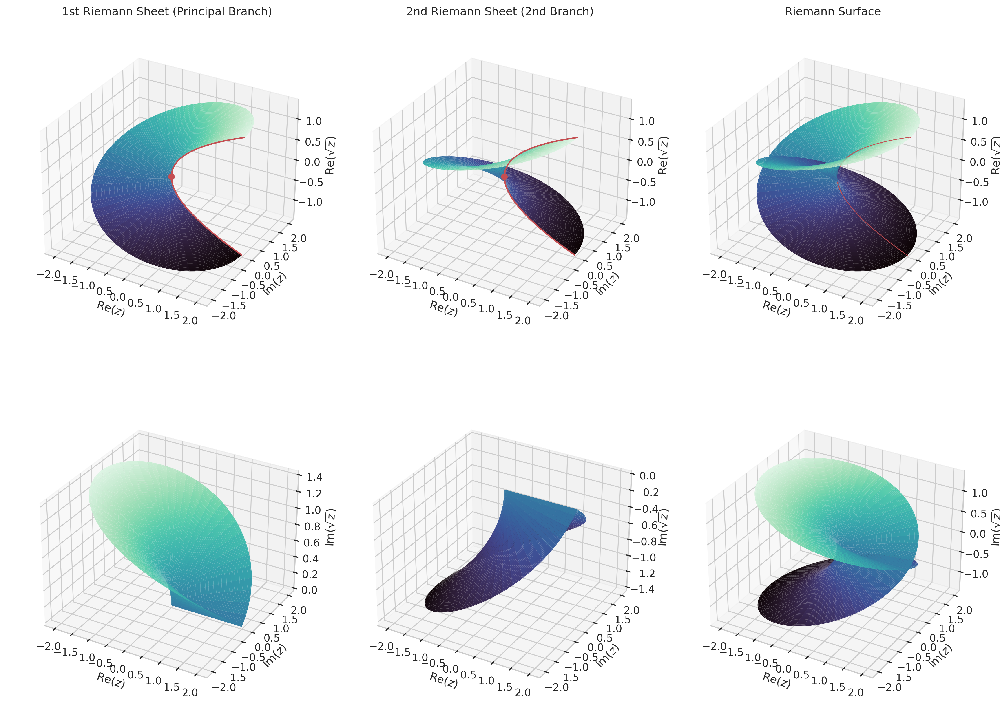

In [228]:
plt.close("all")
fig, ax = plt.subplots(2, 3, figsize=(15, 12), subplot_kw={"projection": "3d"}, dpi=300)

real_z = np.linspace(0, 2, 100)
sqrt_line = np.sqrt(real_z)
neg_sqrt_line = -np.sqrt(real_z)

ax[0, 0].plot_surface(X, Y, np.real(sqrtZ), cmap="mako", lw=0, norm=color_norm)
ax[0, 0].set_title("1st Riemann Sheet (Principal Branch)")

ax[0, 1].plot_surface(
    X, Y, np.real(sqrtZ_2nd_branch), cmap="mako", lw=0, norm=color_norm
)
ax[0, 1].set_title("2nd Riemann Sheet (2nd Branch)")

ax[0, 2].plot_surface(X, Y, np.real(sqrtZ), cmap="mako", lw=0, norm=color_norm)
ax[0, 2].plot_surface(
    X, Y, np.real(sqrtZ_2nd_branch), cmap="mako", lw=0, norm=color_norm
)
ax[0, 2].set_title("Riemann Surface")

for axis in ax[0]:
    axis.plot3D(real_z, 0, sqrt_line, "r")
    axis.plot3D(real_z, 0, neg_sqrt_line, "r")
    axis.plot3D([0], [0], [0], "ro")
    axis.set_xlabel(r"Re($z$)")
    axis.set_ylabel(r"Im($z$)")
    axis.set_zlabel(r"Re($\sqrt{z}$)")
    axis.set_box_aspect(None, zoom=0.9)

ax[1, 0].plot_surface(X, Y, np.imag(sqrtZ), cmap="mako", lw=0, norm=color_norm)

ax[1, 1].plot_surface(
    X, Y, np.imag(sqrtZ_2nd_branch), cmap="mako", lw=0, norm=color_norm
)

ax[1, 2].plot_surface(X, Y, np.imag(sqrtZ), cmap="mako", lw=0, norm=color_norm)
ax[1, 2].plot_surface(
    X, Y, np.imag(sqrtZ_2nd_branch), cmap="mako", lw=0, norm=color_norm
)

for axis in ax[1]:
    axis.set_xlabel(r"Re($z$)")
    axis.set_ylabel(r"Im($z$)")
    axis.set_zlabel(r"Im($\sqrt{z}$)")
    axis.set_box_aspect(None, zoom=0.9)

plt.tight_layout()

if save_fig:
    fig.savefig(
        f"{fig_dir}/sqrt_z_3d.png",
        dpi=300,
    )
    fig.savefig(
        f"{fig_dir}/sqrt_z_3d.pdf",
        dpi=300,
    )
plt.show()

As already mentioned, the branch cut can be chosen arbitrarily. When using the square root function of `numpy` with a complex argument, the branch cut is chosen from $0$ to $-\infty$ instead of $0$ to $+\infty$.

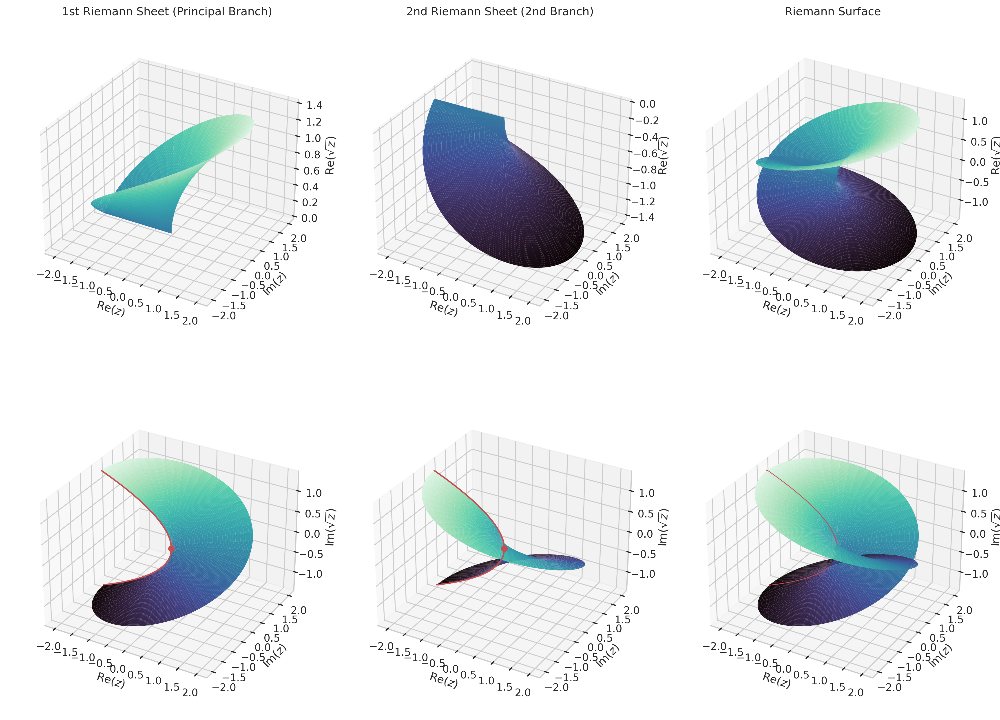

In [229]:
r = np.linspace(0, 2, 100)
phi = np.linspace(-np.pi, np.pi, 100)

R, PHI = np.meshgrid(r, phi)
absZ = R

X = R * np.cos(PHI)
Y = R * np.sin(PHI)

real_z = np.linspace(0, 2, 100)
sqrt_line = np.sqrt(real_z)
neg_sqrt_line = -np.sqrt(real_z)

sqrtZ_np = np.sqrt(X + 1j * Y)
sqrtZ_2nd_branch_np = -np.sqrt(X + 1j * Y)

plt.close("all")
fig, ax = plt.subplots(2, 3, figsize=(15, 12), subplot_kw={"projection": "3d"}, dpi=300)

ax[0, 0].plot_surface(X, Y, np.real(sqrtZ_np), cmap="mako", lw=0, norm=color_norm)
ax[0, 0].set_title("1st Riemann Sheet (Principal Branch)")

ax[0, 1].plot_surface(
    X, Y, np.real(sqrtZ_2nd_branch_np), cmap="mako", lw=0, norm=color_norm
)
ax[0, 1].set_title("2nd Riemann Sheet (2nd Branch)")

ax[0, 2].plot_surface(X, Y, np.real(sqrtZ_np), cmap="mako", lw=0, norm=color_norm)
ax[0, 2].plot_surface(
    X, Y, np.real(sqrtZ_2nd_branch_np), cmap="mako", lw=0, norm=color_norm
)
ax[0, 2].set_title("Riemann Surface")

for axis in ax[0]:
    axis.set_xlabel(r"Re($z$)")
    axis.set_ylabel(r"Im($z$)")
    axis.set_zlabel(r"Re($\sqrt{z}$)")
    axis.set_box_aspect(None, zoom=0.9)

ax[1, 0].plot_surface(X, Y, np.imag(sqrtZ_np), cmap="mako", lw=0, norm=color_norm)

ax[1, 1].plot_surface(
    X, Y, np.imag(sqrtZ_2nd_branch_np), cmap="mako", lw=0, norm=color_norm
)

ax[1, 2].plot_surface(X, Y, np.imag(sqrtZ_np), cmap="mako", lw=0, norm=color_norm)
ax[1, 2].plot_surface(
    X, Y, np.imag(sqrtZ_2nd_branch_np), cmap="mako", lw=0, norm=color_norm
)

for axis in ax[1]:
    axis.plot3D([0], [0], [0], "ro")
    axis.plot3D(-real_z, 0, sqrt_line, "r")
    axis.plot3D(-real_z, 0, neg_sqrt_line, "r")
    axis.set_xlabel(r"Re($z$)")
    axis.set_ylabel(r"Im($z$)")
    axis.set_zlabel(r"Im($\sqrt{z}$)")
    axis.set_box_aspect(None, zoom=0.9)

plt.tight_layout()

if save_fig:
    fig.savefig(
        f"{fig_dir}/sqrt_z_3d_left_hand_cut.png",
        dpi=300,
    )
    fig.savefig(
        f"{fig_dir}/sqrt_z_3d_left_hand_cut.pdf",
        dpi=300,
    )
plt.show()

### 1.2 The Complex Absolute Momentum & Phase Space Factor of a 2 Particle Reaction

Next we return to the parameterization of a 2 particle reaction. First we want to introduce the classical definition of the size of the phase space for a 2 body channel $c$, dependent on the squared center-of-momentum energy (Mandelstam variable) $s=(p_1+p_2)^2$. The phase space factor is defined as

$$\rho(s) = \frac{(2\pi)^4}{2}\int\text{d}\Phi_2 = \frac{1}{16\pi}\frac{2|\vec{p}|}{\sqrt{s}},$$

with the 2 body phase space element

$$d\Phi_2(P;p_1,p_2)=\delta^4(P-p_1 -p_2)\frac{\text{d}^3p_1}{(2\pi)^3 2E_1}\frac{\text{d}^3p_2}{(2\pi)^3 2E_2},$$

$P$, $p_1$ and $p_2$ being the 4-momenta of the mother system, first daughter and second daughter particle, respectively. In the center-of-momentum frame of the mother system, meaning $\vec{P}=0$, the absolute 3-momenta of the daughter particles become $|\vec{p}_1| = | -\vec{p}_2| = q$. The absolute momentum in this system is defined as

$$q=\frac{\sqrt{\lambda(s,m_1,m_2)}}{2\sqrt{s}},$$

with the invariant masses $m_1$ and $m_2$ of the daughter particles and the Källén function

$$\lambda(x,y,z) = x^2 + y^2 + z^2 - 2xy - 2yz - 2xz.$$

The absolute momentum exhibits a branch point at the production threshold of the daughter particles $s_\text{th} = (m_1 + m_2)^2$, and it is convention to choose the branch cut from the threshold to $+\infty$. This means for easier programming and also easily switch the branches of the square root we define our own square root via the angle and radius on the complex plain.

Now we can define our absolute 3-momentum & phase space factor.

In [230]:
from utils.dynamics import q, rho

Let's see how the momentum & phase space factor looks like for the 2 body channels $K^+K^-$ and $K^+\pi^-$.

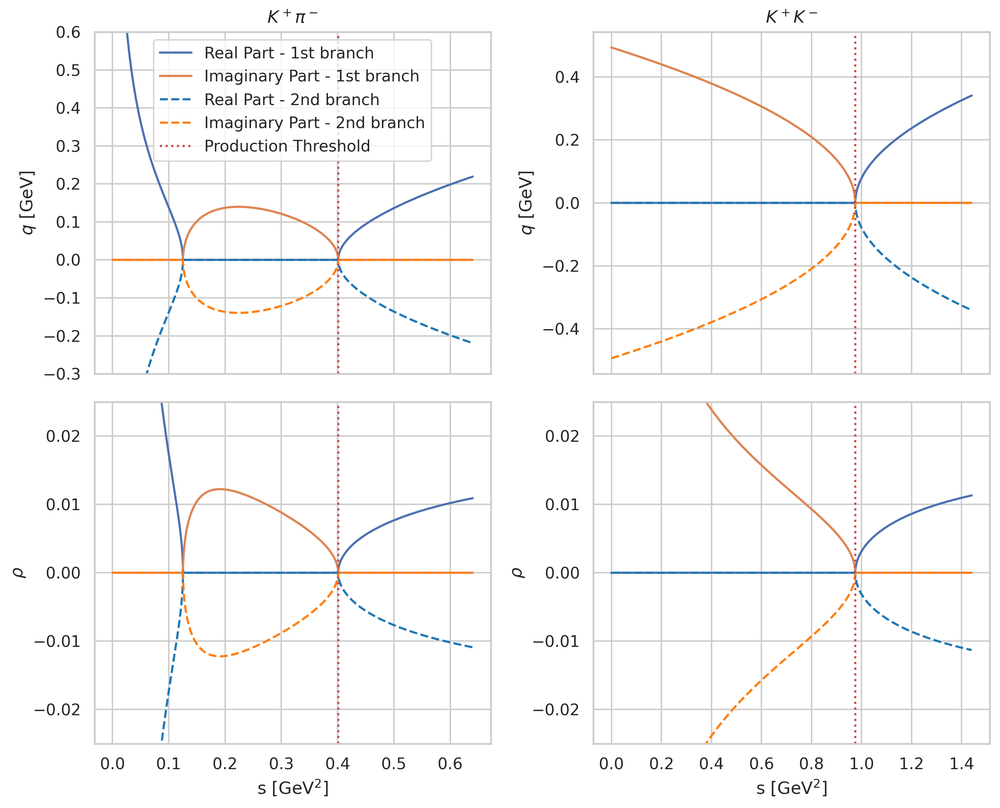

In [231]:
s1 = np.linspace(1e-5, 0.8**2, 500)
s2 = np.linspace(1e-5, 1.2**2, 500)

mK = 0.493677  # GeV
mpi = 0.139570  # GeV

plt.close("all")
fig, ax = plt.subplots(2, 2, figsize=(10, 8), sharex="col", dpi=300)

ax[0, 0].set_title("$K^+\pi^-$")
ax[0, 0].plot(s1, np.real(q(s1, mK, mpi)), label="Real Part - 1st branch")
ax[0, 0].plot(s1, np.imag(q(s1, mK, mpi)), label="Imaginary Part - 1st branch")
ax[0, 0].plot(
    s1, np.real(q(s1, mK, mpi, -1)), "--", c="tab:blue", label="Real Part - 2nd branch"
)
ax[0, 0].plot(
    s1,
    np.imag(q(s1, mK, mpi, -1)),
    "--",
    c="tab:orange",
    label="Imaginary Part - 2nd branch",
)
ax[0, 0].axvline((mpi + mK) ** 2, ls=":", c="r", label="Production Threshold")
ax[0, 0].set_ylim(-0.3, 0.6)
ax[0, 0].legend(loc="upper center")
ax[0, 0].set_ylabel(r"$q$ [GeV]")

ax[0, 1].set_title("$K^+K^-$")
ax[0, 1].plot(s2, np.real(q(s2, mK, mK)))
ax[0, 1].plot(s2, np.imag(q(s2, mK, mK)))
ax[0, 1].plot(s2, np.real(q(s2, mK, mK, -1)), "--", c="tab:blue")
ax[0, 1].plot(s2, np.imag(q(s2, mK, mK, -1)), "--", c="tab:orange")
ax[0, 1].axvline(4 * mK**2, ls=":", c="r")
ax[0, 1].set_ylabel(r"$q$ [GeV]")

ax[1, 0].plot(s1, np.real(rho(s1, mK, mpi)), label="Real Part - 1st branch")
ax[1, 0].plot(s1, np.imag(rho(s1, mK, mpi)), label="Imaginary Part - 1st branch")
ax[1, 0].plot(
    s1,
    np.real(rho(s1, mK, mpi, -1)),
    "--",
    c="tab:blue",
    label="Real Part - 2nd branch",
)
ax[1, 0].plot(
    s1,
    np.imag(rho(s1, mK, mpi, -1)),
    "--",
    c="tab:orange",
    label="Imaginary Part - 2nd branch",
)
ax[1, 0].axvline((mpi + mK) ** 2, ls=":", c="r", label="Production Threshold")
ax[1, 0].set_ylim(-0.025, 0.025)
ax[1, 0].set_xlabel("s [GeV$^2$]")
ax[1, 0].set_ylabel(r"$\rho$")

ax[1, 1].plot(s2, np.real(rho(s2, mK, mK)))
ax[1, 1].plot(s2, np.imag(rho(s2, mK, mK)))
ax[1, 1].plot(s2, np.real(rho(s2, mK, mK, -1)), "--", c="tab:blue")
ax[1, 1].plot(s2, np.imag(rho(s2, mK, mK, -1)), "--", c="tab:orange")
ax[1, 1].axvline(4 * mK**2, ls=":", c="r")
ax[1, 1].set_xlabel("s [GeV$^2$]")
ax[1, 1].set_ylabel(r"$\rho$")
ax[1, 1].set_ylim(-0.025, 0.025)

plt.tight_layout()

if save_fig:
    fig.savefig(
        f"{fig_dir}/q_and_rho.png",
        dpi=300,
    )
    fig.savefig(
        f"{fig_dir}/q_and_rho.pdf",
        dpi=300,
    )
plt.show()

We can see that the momentum is positive above threshold on the 1st branch. As this is what we observe in the real world, this branch is commonly called the "physical branch" while the 2nd branch, with a real negative absolute momentum, is called the "unphysical branch". Furthermore, we observe that a second branch point appears and that the real part diverges for $s\to 0$ if $m_1\neq m_2$. This is not important if one only wants to parameterize a single channel above threshold, but if multiple channels are combined, this 2nd, unphysical branch point could lie above threshold of another open channel, influencing the shape of the amplitude. 

### 1.3 Centrifugal Barrier Factors and the Chew-Mandelstam Function

Due to the shortcomings of the previous parameterization for multi-channel descriptions one commonly replaces $i\rho B_L^2$ with the Chew-Mandelstam function

$$\mathit{\Sigma}_L(s)=\frac{s-s_\text{th}}{\pi}\int^\infty_{s_\text{th}} \frac{\rho(s')B^2_L(s')}{(s'-s_\text{th})(s'-s)}\text{d}s',$$

with $L$ being the relative angular momentum between the daughter particles and $B_L(s)$ being a phenomenological centrifugal barrier factor, also called Blatt-Weisskopf barrier factor, which suppresses the phase space of angular excitations of the daughter system for small momenta, with respect to a momentum scale $q_0$. The square of this factor $\nu_L=B_L^2$ was originally introduced as a penetration factor to describe the probability that an incoming wave with a wave number $k$ can penetrate a nucleus with an angular momentum of $L$, a potential $V(r)$ and a radius $R$. However, the same argumentation can be used for a wave originating from inside the nucleus, trying to get outside, which is more comparable to our application. For small wave numbers (momenta) of the incident wave compared to the wave number (momentum) of the nucleus, the transmission coefficient gets proportional to the penetration factor

$$ \nu_L(x) = \frac{1}{G_L^2(x)+F_L^2(x)},$$

with $x=kR$, $F_L(x)$ and $G_L(x)$ being the regular and irregular solutions of differential equation

$$ \frac{\text{d}^2u_L}{\text{d}r^2}+\left(k^2-\frac{L(L+1)}{r^2}-2MV(r)\right)u_L(r)=0 $$

for the radial wave function $u_L(r)$ with the reduced mass $M$ and wave number $k$. For $V(r)=0$ the solutions can be expressed via spherical Bessel and Neumann functions $j_L$ and $n_L$ resulting in

$$ \nu_L(x) = \frac{1}{x^2 \left[j_L^2(x) + n_L^2(x)\right]} = \frac{1}{x^2|h^{(1)}_L(x)|^2}, $$

where in the last step the identity $h_L^{(1)}(x)=j_L(x)+i\,n_L(x)$ of the first spherical Hankel function is used. This means the Blatt-Weisskopf barrier factors that are usually used in the parameterizations of hadronic resonances are defined as

$$ B_L(x) = \frac{1}{x \sqrt{j_L^2(x) + n_L^2(x)}} = \frac{1}{x|h^{(1)}_L(x)|} $$
$$ B_0(x) = 1 $$
$$ B_1(x) = \frac{x}{\sqrt{1+x^2}} $$
$$ B_2(x) = \frac{x^2}{\sqrt{9+3x^2+x^4}} $$
$$ ... $$

where we choose the principal branch for the square roots. From this follows $q/q_0=kR$, meaning that the inverse scale factor $1/q_0$ is connected to the particle radius R in this representation. The PDG cites a range for $1/q_0$ from $1\,\text{(GeV/c)}^{-1}$ to $5\,\text{(GeV/c)}^{-1}$, which corresponds to $197.3\,\text{am}$ to $39.47\,\text{am}$ using $R=\hbar/q_0$ (shortly deviating from natural units for this part).

Let's first define the  barrier factors behave up to $L=2$.

In [232]:
from utils.dynamics import B

Now we gonna plot the real and imaginary parts of the factor for $L=1$ and $L=2$ on the physical und unphysical sheets of the momentum of the $K^+\pi^-$ system. The solid lines are the real part and the dashed lines the imaginary part of the barrier factors for different momentum scales $q_0$.

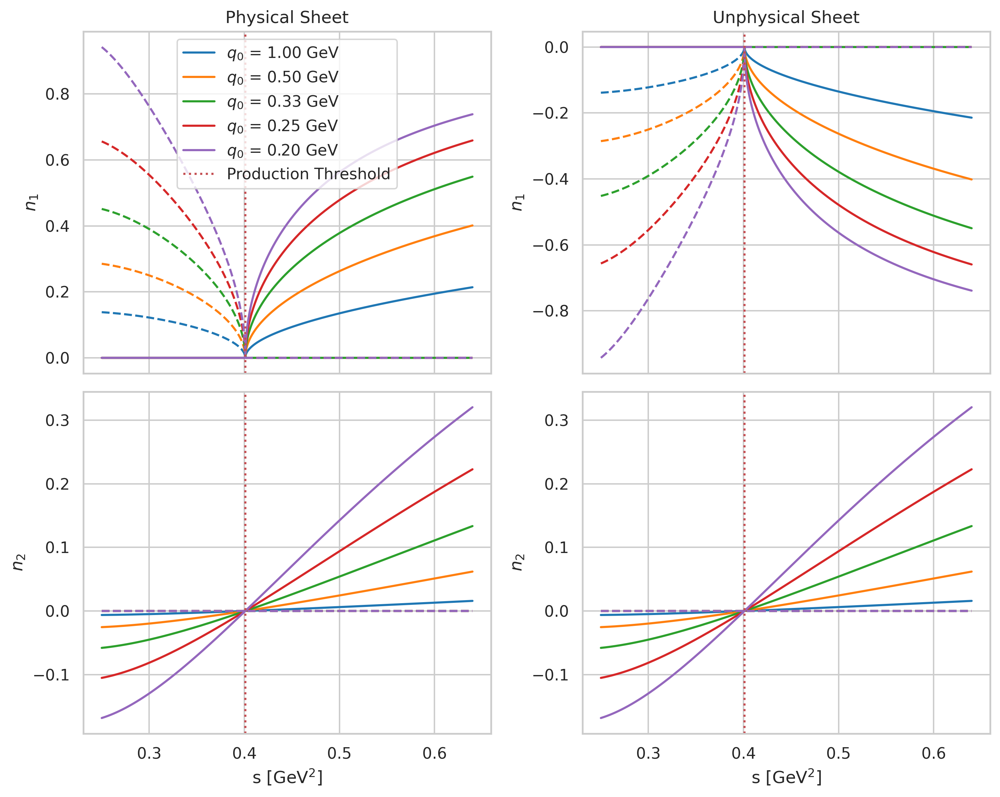

In [233]:
plt.close("all")

s1 = np.linspace(0.5**2, 0.8**2, 500)

q0s = 1.0 / np.array([1.0, 2.0, 3.0, 4.0, 5.0])  # GeV

colors = color_sequences["tab10"]

fig, ax = plt.subplots(2, 2, figsize=(10, 8), sharex="col", dpi=300)

ax[0, 0].set_title("Physical Sheet")
for i, q0 in enumerate(q0s):
    ax[0, 0].plot(
        s1,
        np.real(B(s1, mK, mpi, 1, q0)),
        label="$q_0$ = " + f"{q0:.2f}" + " GeV",
        c=colors[i],
    )
    ax[0, 0].plot(
        s1,
        np.imag(B(s1, mK, mpi, 1, q0)),
        ls="--",
        c=colors[i],
    )
ax[0, 0].axvline((mpi + mK) ** 2, ls=":", c="r", label="Production Threshold")
ax[0, 0].legend()
ax[0, 0].set_ylabel(r"$n_1$")

ax[0, 1].set_title("Unphysical Sheet")
for i, q0 in enumerate(q0s):
    ax[0, 1].plot(s1, np.real(B(s1, mK, mpi, 1, q0, -1)), c=colors[i])
    ax[0, 1].plot(
        s1,
        np.imag(B(s1, mK, mpi, 1, q0, -1)),
        ls="--",
        c=colors[i],
    )
ax[0, 1].axvline((mpi + mK) ** 2, ls=":", c="r")
ax[0, 1].set_ylabel(r"$n_1$")

for i, q0 in enumerate(q0s):
    ax[1, 0].plot(
        s1,
        np.real(B(s1, mK, mpi, 2, q0)),
        c=colors[i],
    )
    ax[1, 0].plot(
        s1,
        np.imag(B(s1, mK, mpi, 2, q0)),
        ls="--",
        c=colors[i],
    )
ax[1, 0].axvline((mpi + mK) ** 2, ls=":", c="r")
ax[1, 0].set_xlabel("s [GeV$^2$]")
ax[1, 0].set_ylabel(r"$n_2$")

for i, q0 in enumerate(q0s):
    ax[1, 1].plot(s1, np.real(B(s1, mK, mpi, 2, q0, -1)), c=colors[i])
    ax[1, 1].plot(s1, np.imag(B(s1, mK, mpi, 2, q0, -1)), ls="--", c=colors[i])
ax[1, 1].axvline((mpi + mK) ** 2, ls=":", c="r")
ax[1, 1].set_xlabel("s [GeV$^2$]")
ax[1, 1].set_ylabel(r"$n_2$")

plt.tight_layout()

if save_fig:
    fig.savefig(
        f"{fig_dir}/BW_fac.png",
        dpi=300,
    )
    fig.savefig(
        f"{fig_dir}/BW_fac.pdf",
        dpi=300,
    )
plt.show()

For $L=1$, and thus $n_0=1$, one gets (according to the PDG review)

$$ \mathit{\Sigma}(s)=\frac{1}{16\pi^2}\left[\frac{2q}{\sqrt{s}}\log{\frac{m_1^2+m_2^2-s+2\sqrt{s}q}{2m_1^2m_2^2}}-(m_1^2-m_2^2)\left(\frac{1}{s}-\frac{1}{(m_1+m_2)^2}\right)\log{\frac{m_1}{m_2}}\right]. $$

An alternative definition from Dudek et. al. is:

$$ C(s) = \frac{\rho}{\pi}\ln{\left( \frac{\xi + \rho}{\xi - \rho} \right)} - \frac{\xi}{\pi} \frac{m_2 - m_1}{m_1 + m_2} \ln{\left(\frac{m_2}{m_1}\right)} $$

with

$$ \rho = \sqrt{1 - \frac{(m_1 + m_2)^2}{s}} \sqrt{1 - \frac{(m_1 - m_2)^2}{s}} $$

and

$$ \xi = 1 - \frac{(m_1 + m_2)^2}{s} $$



In [234]:
from utils.dynamics import (
    cm,
    q_cm,
    B_cm,
    rho_dudek,
    rho_dudek_arr,
    cm_dudek,
    cm_dudek_arr,
)

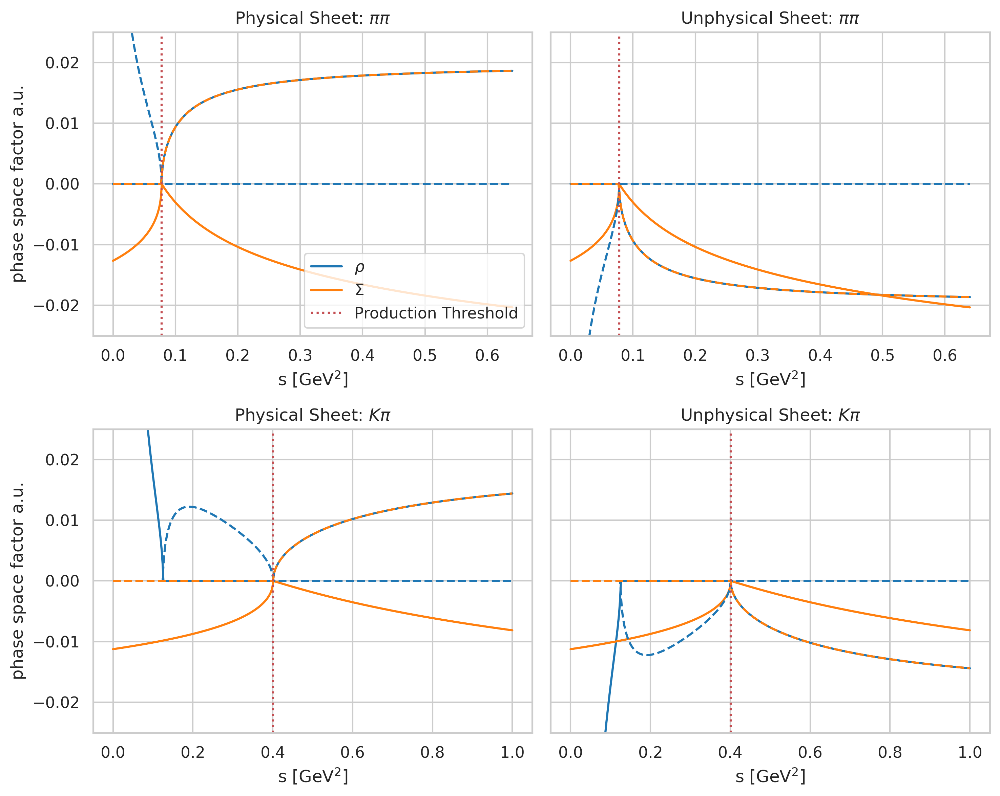

In [235]:
s1 = np.linspace(1e-5, 0.8**2, 500)
s2 = np.linspace(1e-5, 1.0**2, 500)

plt.close("all")

fig, ax = plt.subplots(2, 2, figsize=(10, 8), dpi=300, sharey="row")

# Physical sheet pipi
ax[0, 0].set_title(r"Physical Sheet: $\pi\pi$")
ax[0, 0].plot(np.real(s1), np.real(rho(s1, mpi, mpi, 1)), label=r"$\rho$", c="tab:blue")
ax[0, 0].plot(
    np.real(s1),
    np.real(cm(s1, mpi, mpi, 1)),
    label=r"$\Sigma$",
    c="tab:orange",
)
ax[0, 0].plot(np.real(s1), np.imag(rho(s1, mpi, mpi, 1)), ls="--", c="tab:blue")
ax[0, 0].plot(
    np.real(s1),
    np.imag(cm(s1, mpi, mpi, 1)),
    ls="--",
    c="tab:orange",
)

ax[0, 0].axvline((mpi + mpi) ** 2, ls=":", c="r", label="Production Threshold")
ax[0, 0].legend(loc="lower right", ncols=1)
ax[0, 0].set_ylabel(r"phase space factor a.u.")
ax[0, 0].set_xlabel("s [GeV$^2$]")
ax[0, 0].set_ylim(-0.025, 0.025)

# Physical sheet Kpi
ax[1, 0].set_title(r"Physical Sheet: $K\pi$")
ax[1, 0].plot(np.real(s2), np.real(rho(s2, mK, mpi, 1)), label=r"$\rho$", c="tab:blue")
ax[1, 0].plot(
    np.real(s2),
    np.real(cm(s2, mK, mpi, 1)),
    label=r"$\Sigma$",
    c="tab:orange",
)
ax[1, 0].plot(np.real(s2), np.imag(rho(s2, mK, mpi, 1)), ls="--", c="tab:blue")
ax[1, 0].plot(
    np.real(s2),
    np.imag(cm(s2, mK, mpi, 1)),
    ls="--",
    c="tab:orange",
)
ax[1, 0].axvline((mK + mpi) ** 2, ls=":", c="r", label="Production Threshold")
ax[1, 0].set_ylim(-0.025, 0.025)
ax[1, 0].set_xlabel("s [GeV$^2$]")
ax[1, 0].set_ylabel(r"phase space factor a.u.")

# Unphysical sheet pipi
ax[0, 1].set_title(r"Unphysical Sheet: $\pi\pi$")
ax[0, 1].plot(
    np.real(s1), np.real(rho(s1, mpi, mpi, -1)), label=r"$\rho$", c="tab:blue"
)
ax[0, 1].plot(
    np.real(s1),
    np.real(cm(s1, mpi, mpi, -1)),
    label=r"$\Sigma$",
    c="tab:orange",
)
ax[0, 1].plot(np.real(s1), np.imag(rho(s1, mpi, mpi, -1)), ls="--", c="tab:blue")
ax[0, 1].plot(
    np.real(s1),
    np.imag(cm(s1, mpi, mpi, -1)),
    ls="--",
    c="tab:orange",
)
ax[0, 1].set_ylim(-0.025, 0.025)
ax[0, 1].set_xlabel("s [GeV$^2$]")
ax[0, 1].axvline((mpi + mpi) ** 2, ls=":", c="r", label="Production Threshold")

# Unphysical sheet Kpi
ax[1, 1].set_title(r"Unphysical Sheet: $K\pi$")
ax[1, 1].plot(np.real(s2), np.real(rho(s2, mK, mpi, -1)), label=r"$\rho$", c="tab:blue")
ax[1, 1].plot(
    np.real(s2),
    np.real(cm(s2, mK, mpi, -1)),
    label=r"$\Sigma$",
    c="tab:orange",
)
ax[1, 1].plot(np.real(s2), np.imag(rho(s2, mK, mpi, -1)), ls="--", c="tab:blue")
ax[1, 1].plot(
    np.real(s2),
    np.imag(cm(s2, mK, mpi, -1)),
    ls="--",
    c="tab:orange",
)
ax[1, 1].axvline((mpi + mK) ** 2, ls=":", c="r", label="Production Threshold")
ax[1, 1].set_ylim(-0.025, 0.025)
ax[1, 1].set_xlabel("s [GeV$^2$]")

plt.tight_layout()

if save_fig:
    fig.savefig(
        f"{fig_dir}/rho_and_cm.png",
        dpi=300,
    )
    fig.savefig(
        f"{fig_dir}/rho_and_cm.pdf",
        dpi=300,
    )
plt.show()

Blatt-Weisskopf factors with the momentum being determined via the Chew-Mandelstam elements via using the relations $\rho = \frac{1}{16\pi} \frac{2q}{\sqrt{s}}$ and $\text{Im}(\Sigma) = \rho$, leading to $q = 8 \pi\sqrt{s} \text{Im}(\Sigma)$

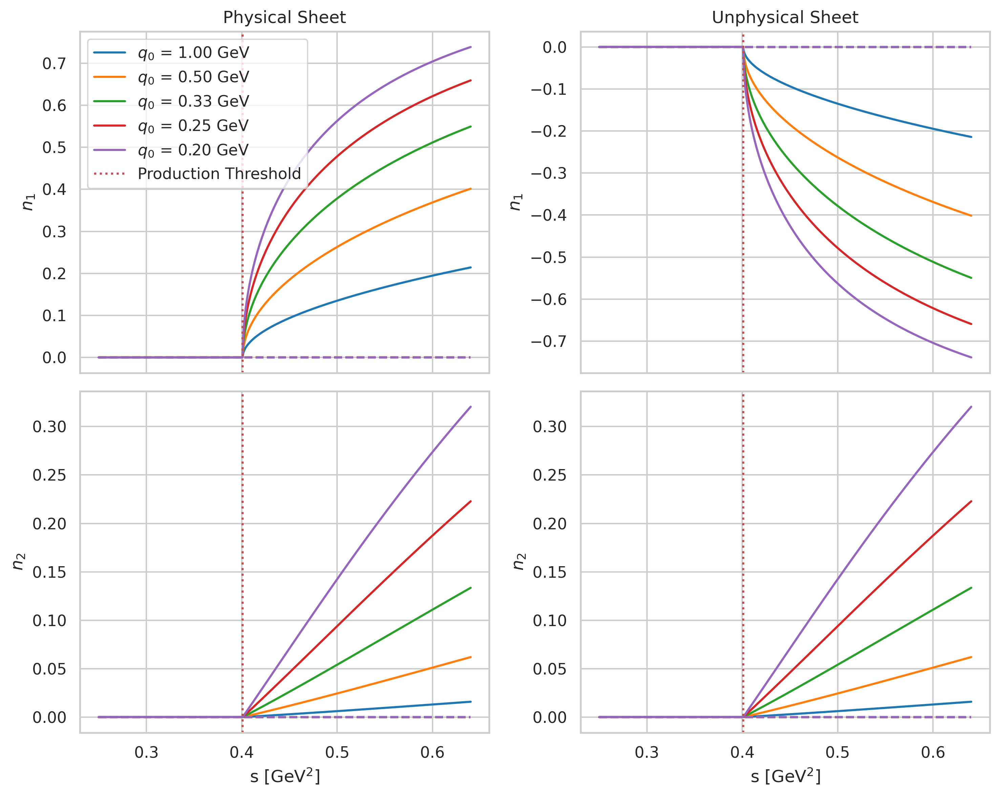

In [236]:
plt.close("all")

s1 = np.linspace(0.5**2, 0.8**2, 500)

q0s = 1.0 / np.array([1.0, 2.0, 3.0, 4.0, 5.0])  # GeV

colors = color_sequences["tab10"]

fig, ax = plt.subplots(2, 2, figsize=(10, 8), sharex="col", dpi=300)

ax[0, 0].set_title("Physical Sheet")
for i, q0 in enumerate(q0s):
    ax[0, 0].plot(
        s1,
        np.real(B_cm(s1, mK, mpi, 1, q0)),
        label="$q_0$ = " + f"{q0:.2f}" + " GeV",
        c=colors[i],
    )
    ax[0, 0].plot(
        s1,
        np.imag(B_cm(s1, mK, mpi, 1, q0)),
        ls="--",
        c=colors[i],
    )
ax[0, 0].axvline((mpi + mK) ** 2, ls=":", c="r", label="Production Threshold")
ax[0, 0].legend()
ax[0, 0].set_ylabel(r"$n_1$")

ax[0, 1].set_title("Unphysical Sheet")
for i, q0 in enumerate(q0s):
    ax[0, 1].plot(s1, np.real(B_cm(s1, mK, mpi, 1, q0, -1)), c=colors[i])
    ax[0, 1].plot(
        s1,
        np.imag(B_cm(s1, mK, mpi, 1, q0, -1)),
        ls="--",
        c=colors[i],
    )
ax[0, 1].axvline((mpi + mK) ** 2, ls=":", c="r")
ax[0, 1].set_ylabel(r"$n_1$")

for i, q0 in enumerate(q0s):
    ax[1, 0].plot(
        s1,
        np.real(B_cm(s1, mK, mpi, 2, q0)),
        c=colors[i],
    )
    ax[1, 0].plot(
        s1,
        np.imag(B_cm(s1, mK, mpi, 2, q0)),
        ls="--",
        c=colors[i],
    )
ax[1, 0].axvline((mpi + mK) ** 2, ls=":", c="r", label="Production Threshold")
ax[1, 0].set_xlabel("s [GeV$^2$]")
ax[1, 0].set_ylabel(r"$n_2$")

for i, q0 in enumerate(q0s):
    ax[1, 1].plot(s1, np.real(B_cm(s1, mK, mpi, 2, q0, -1)), c=colors[i])
    ax[1, 1].plot(s1, np.imag(B_cm(s1, mK, mpi, 2, q0, -1)), ls="--", c=colors[i])
ax[1, 1].axvline((mpi + mK) ** 2, ls=":", c="r")
ax[1, 1].set_xlabel("s [GeV$^2$]")
ax[1, 1].set_ylabel(r"$n_2$")

plt.tight_layout()

if save_fig:
    fig.savefig(
        f"{fig_dir}/BW_fac_cm.png",
        dpi=300,
    )
    fig.savefig(
        f"{fig_dir}/BW_fac_cm.pdf",
        dpi=300,
    )
plt.show()

Define a 1 channel 1 resonance decay amplitude as

$$ A = \left[ 1 - K i \rho \right]^{-1} P, $$

or by using the Chew-Mandelstam element as

$$  A = \left[ 1 + K \Sigma \right]^{-1} P, $$

with the K-matrix element

$$ K = n_J \left( \frac{g^2}{m_0^2-s} + c \right) n_J ,$$

and the P-vector element

$$ P = \left( \frac{\beta g}{m_0^2 - s} + b \right) n_J $$

In [237]:
from utils.dynamics import amp, amp2, amp3

Use the Breit-Wigner parameters $M_\text{BW}$ and $\Gamma_\text{BW}$ to get the coupling constant $g_c$ in the one two body channel $c$ one resonance edge case via
$$ g_c = \sqrt{\frac{M_\text{BW}\Gamma_\text{BW}}{\rho(M_\text{BW}^2,m_{c,1},m_{c,2})}} $$

Try the parameterization for the decay $\phi\to K^+ K^-$

In [259]:
branch = 1
L = 1
b = 0.1
q0 = 0.33
m0 = 1.019461
width = 0.004249
g = np.sqrt(
    m0
    * width
    / (
        rho(m0**2 + 1.0j * m0 * width, mK, mK, branch)
        * B(m0**2, mK, mK, L, q0, branch) ** 2
    )
)
a0 = 0
c0 = 0

s = np.linspace(0.9**2, 1.2**2, 500) + 0.0j

In [260]:
amp_rho = amp(
    s, m1=mK, m2=mK, L=L, q0=q0, g=g, beta=b, m0=m0, c=a0, b=c0, branch=branch
)
mag_rho = abs(amp_rho)
phase_rho = np.angle(amp_rho)
phsp_rho = np.real(rho(s, mK, mK, branch))
int_rho = abs(amp_rho * np.sqrt(phsp_rho)) ** 2

amp_cm = amp2(
    s, m1=mK, m2=mK, L=L, q0=q0, g=g, beta=b, m0=m0, c=a0, b=c0, branch=branch
)
mag_cm = abs(amp_cm)
phase_cm = np.angle(amp_cm)
cm_val = cm(s, mK, mK, branch)
phsp_cm = np.imag(cm_val)
phsp_cm[phsp_cm < 1e-10] = 0.0
int_cm = abs(amp_cm * np.sqrt(phsp_cm)) ** 2

amp_dudek = amp3(
    s, m1=mK, m2=mK, L=L, q0=q0, g=g, beta=b, m0=m0, c=a0, b=c0, branch=branch
)
mag_dudek = abs(amp_dudek)
phase_dudek = np.angle(amp_dudek)
dudek = cm_dudek_arr(s, mK, mK, branch)
phsp_dudek = -1 / (16 * np.pi) * np.imag(dudek)
phsp_dudek[phsp_dudek < 1e-10] = 0.0
int_dudek = abs(amp_dudek * np.sqrt(phsp_dudek)) ** 2
print("g:", np.real(g), "GeV")

g: 2.6032759276843476 GeV


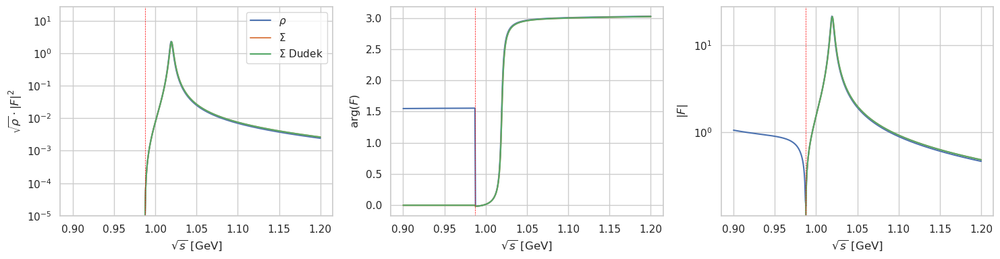

In [261]:
plt.close("all")
fig, ax = plt.subplots(1, 3, figsize=(15, 4))
ax[0].plot(
    np.real(np.sqrt(s)),
    int_rho,
    label=r"$\rho$",
)
ax[0].plot(
    np.real(np.sqrt(s)),
    int_cm,
    label=r"$\Sigma$",
)
ax[0].plot(np.real(np.sqrt(s)), int_dudek, label=r"$\Sigma$ Dudek")
ax[0].legend()
ax[0].set_ylabel(r"$\sqrt{\rho}\cdot|F|^2$")
ax[0].set_yscale("log")
ax[0].set_ylim(
    1e-5,
)

ax[1].plot(
    np.real(np.sqrt(s)),
    phase_rho,
)
ax[1].plot(
    np.real(np.sqrt(s)),
    phase_cm,
)
ax[1].plot(np.real(np.sqrt(s)), phase_dudek)
ax[1].set_ylabel("arg($F$)")

ax[2].plot(
    np.real(np.sqrt(s)),
    mag_rho,
)
ax[2].plot(
    np.real(np.sqrt(s)),
    mag_cm,
)
ax[2].plot(np.real(np.sqrt(s)), mag_dudek)
ax[2].set_ylabel("|$F$|")
ax[2].set_xlabel(r"$\sqrt{s}$ [GeV]")
ax[2].set_yscale("log")

for axis in ax:
    axis.axvline(mK + mK, color="red", lw=0.5, ls="--")
    axis.set_xlabel(r"$\sqrt{s}$ [GeV]")

plt.tight_layout()
if save_fig:
    fig.savefig(
        f"{fig_dir}/phi_res_amp.png",
        dpi=300,
    )
    fig.savefig(
        f"{fig_dir}/phi_res_amp.pdf",
        dpi=300,
    )
plt.show()

In [262]:
s_imag = np.linspace(-0.01, 0, 1001) * 1.0j
s_imag2 = np.linspace(0, 0.001, 1001) * 1.0j
s_real = np.linspace(1.036, 1.042, 101)

In [263]:
S_REAL, S_IMAG = np.meshgrid(s_real, s_imag)
S_REAL_2, S_IMAG_2 = np.meshgrid(s_real, s_imag2)
A = amp3(
    S_REAL + S_IMAG, m1=mK, m2=mK, L=L, q0=q0, g=g, beta=b, m0=m0, c=a0, b=c0, branch=-1
)
A2 = amp3(
    S_REAL_2 + S_IMAG_2,
    m1=mK,
    m2=mK,
    L=L,
    q0=q0,
    g=g,
    beta=b,
    m0=m0,
    c=a0,
    b=c0,
    branch=1,
)

i_maxA = np.argmax(abs(A))
pole_mass = S_REAL.flatten()[i_maxA]
pole_width = np.imag(S_IMAG.flatten()[i_maxA])

for i in range(8):
    s_imag3 = (
        np.linspace(pole_width - 0.01 / 2 ** (i), pole_width + 0.01 / 2 ** (i), 101)
        * 1.0j
    )
    s_real3 = np.linspace(pole_mass - 0.01 / 2 ** (i), pole_mass + 0.01 / 2 ** (i), 101)
    S_REAL_3, S_IMAG_3 = np.meshgrid(s_real3, s_imag3)
    A3 = amp3(
        S_REAL_3 + S_IMAG_3,
        m1=mK,
        m2=mK,
        L=L,
        q0=q0,
        g=g,
        beta=b,
        m0=m0,
        c=a0,
        b=c0,
        branch=-1,
    )
    i_maxA = np.argmax(abs(A3))
    pole_mass = S_REAL_3.flatten()[i_maxA]
    pole_width = np.imag(S_IMAG_3.flatten()[i_maxA])

<IPython.core.display.Math object>

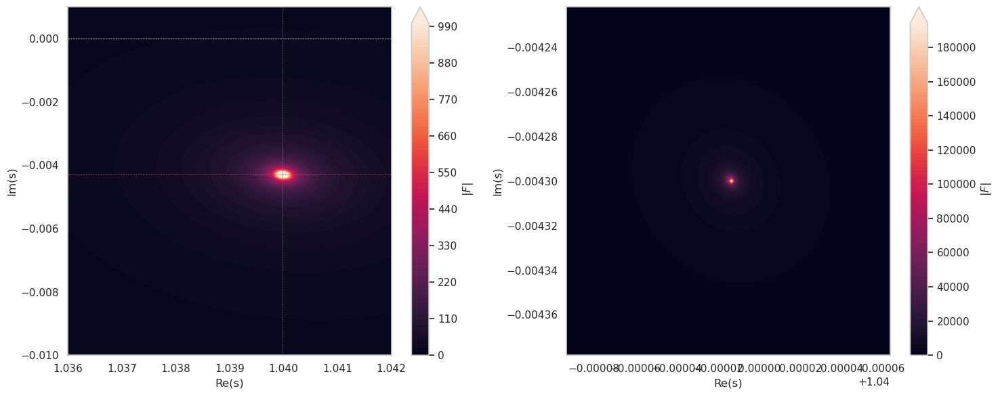

In [265]:
display(
    Math(
        rf"""
             \textbf{{Input parameters:}} \\
             \Re(s_{{pole}}) = {sR_real * 1e3:.3f}  \text{{ MeV}} \\
             \Im(s_{{pole}}) = {-sR_imag * 1e3:.3f} \text{{ MeV}} \\
             \textbf{{Output parameters:}} \\
             \Re(s_{{pole}}) = {pole_mass * 1e3:.3f} \pm {(S_REAL_3[0,1] - S_REAL_3[0,0])*1e3:.3f} \text{{ MeV}} \\
             \Im(s_{{pole}}) = {-pole_width * 1e3:.3f} \pm {np.imag(S_IMAG_3[1,0] - S_IMAG_3[0,0])*1e3:.3f} \text{{ MeV}} \\
             M_\text{{pole}}={np.real(np.sqrt(pole_mass+pole_width*1.j)) * 1e3:.2f} \text{{ MeV}} \\
            \Gamma_\text{{pole}}={-np.imag(np.sqrt(pole_mass + pole_width*1.j)) * 2.0 * 1e3:.2f} \text{{ MeV}} \\
        """
    )
)

fig, ax = plt.subplots(1, 2, figsize=(15, 6))
levels = np.linspace(0, 1e3, 101)
cont = ax[0].contourf(
    np.real(S_REAL),
    np.imag(S_IMAG),
    np.abs(A),
    levels=levels,
    extend="max",
    cmap="rocket",
)
ax[0].contourf(
    np.real(S_REAL_2),
    np.imag(S_IMAG_2),
    np.abs(A2),
    levels=levels,
    extend="max",
    cmap="rocket",
)
ax[0].axhline(0, ls="--", lw=0.5, c="white")
ax[0].axvline(pole_mass, ls="--", lw=0.5, c="r")
ax[0].axhline(pole_width, ls="--", lw=0.5, c="r")
ax[0].set_xlabel("Re(s)")
ax[0].set_ylabel("Im(s)")
plt.colorbar(cont, label="|$F$|", ax=ax[0])

cont2 = ax[1].contourf(
    np.real(S_REAL_3),
    np.imag(S_IMAG_3),
    np.abs(A3),
    levels=100,
    extend="max",
    cmap="rocket",
)
ax[1].set_xlabel("Re(s)")
ax[1].set_ylabel("Im(s)")
plt.colorbar(cont2, label="|$F$|", ax=ax[1])

plt.tight_layout()

if save_fig:
    plt.savefig(
        f"{fig_dir}/phi_res_pole.png",
        dpi=300,
    )
    plt.savefig(
        f"{fig_dir}/phi_res_pole.pdf",
        dpi=300,
    )
plt.show()

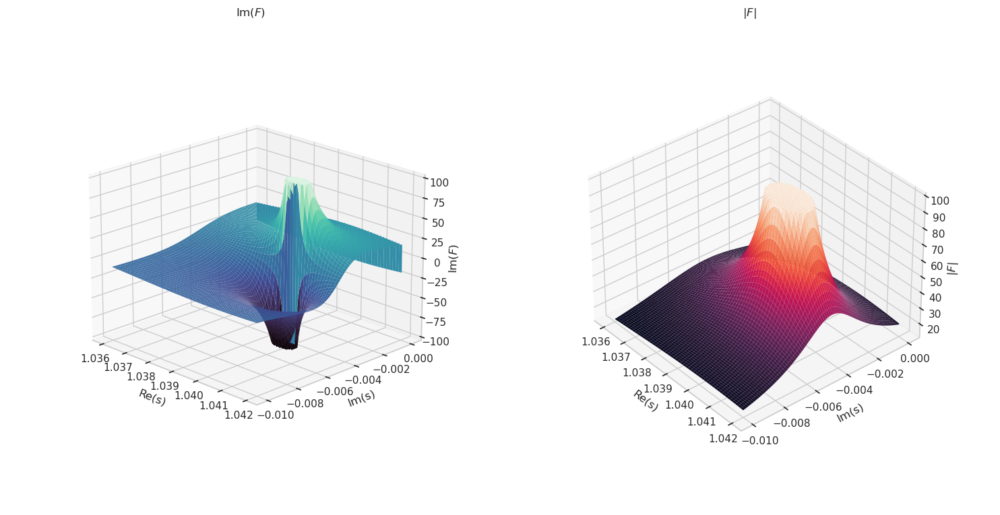

In [248]:
plt.close("all")

fig, ax = plt.subplots(1, 2, subplot_kw={"projection": "3d"}, figsize=(15, 8))

i = np.where(abs(A) > 1e2)
absA = abs(A)
absA[i] = 1e2

i2 = np.where(np.imag(A) > 1e2)
i3 = np.where(np.imag(A) < -1e2)
imA = np.imag(A)
imA[i2] = 1e2
imA[i3] = -1e2

ax[0].set_title("Im($F$)")
ax[0].plot_surface(
    rcount=100,
    ccount=100,
    X=S_REAL,
    Y=np.imag(S_IMAG),
    Z=imA,
    axlim_clip=True,
    shade=True,
    cmap="mako",
    lw=0,
)
ax[0].view_init(20, -45, 0)
ax[0].set_xlabel("Re(s)", labelpad=10)
ax[0].set_ylabel("Im(s)", labelpad=10)
ax[0].set_zlabel(r"Im($F$)")
ax[0].set_box_aspect(None, zoom=0.75)

ax[1].set_title(r"$|F|$")
ax[1].plot_surface(
    rcount=100,
    ccount=100,
    X=S_REAL,
    Y=np.imag(S_IMAG),
    Z=absA,
    axlim_clip=True,
    cmap="rocket",
    lw=0,
)
ax[1].view_init(35, -40, 0)
ax[1].set_xlabel("Re(s)", labelpad=10)
ax[1].set_ylabel("Im(s)", labelpad=10)
ax[1].set_zlabel("$|F|$")
ax[1].set_box_aspect(None, zoom=0.75)

plt.tight_layout()

if save_fig:
    fig.savefig(
        f"{fig_dir}/phi_res_pole_3d.png",
        dpi=300,
    )
    fig.savefig(
        f"{fig_dir}/phi_res_pole_3d.pdf",
        dpi=300,
    )
plt.show()